# Lab03 - CNN Visualization

Jack Easton, Will Bjorndahl, Austin Modoff

# Model Selection

The convolutional neural network that we decided to create visualizations from is VGG19, pretrained on the ImageNet dataset. We chose VGG19 largely because it is entirely feedforward, so we do not have to deal with residuals or other complex structures when searching for filters and inputs to visualize. Because it is feedforward, we feel like it will be easier to conceptualize the structure of the filters and how they effect the resulting outputs.

In [12]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg19 import preprocess_input, decode_predictions
from tensorflow.keras.models import Model

2023-03-22 16:10:35.191264: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-22 16:10:35.307107: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-03-22 16:10:35.312978: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-03-22 16:10:35.312997: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if yo

In [13]:
# initialize keras.application package

tf.keras.applications.VGG19(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
)

2023-03-22 16:10:41.398725: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-03-22 16:10:41.398759: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2023-03-22 16:10:41.398780: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (p-eddfe0b0-336d-4be3-aabf-d557393a7513): /proc/driver/nvidia/version does not exist
2023-03-22 16:10:41.399004: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
574710816/574710816 [==============================] - 3s 0us/st

In [14]:
# load in model
base_model = VGG19(weights='imagenet')

for layer in base_model.layers:
    layer.trainable = False

base_model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [15]:
def load_image_for_vgg_input(img_path, size=(224,224)):
    '''
    Read in image and convert to valid input tensor for VGG19 network.
    '''
    img = image.load_img(img_path, target_size=size)

    # convert to array and preprocess for VGG
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    return x

def prepare_image_for_display(img, norm_type='max'):
    '''
    Scale image to range between 0 and 255 for display purposes.
    '''
    # scale down to 0-1 range
    if norm_type == 'max':
        # min/max scaling, best for regular images
        new_img = (img - img.min()) / (img.max()-img.min())
    else:
        # std scaling, best when we are unsure about large outliers
        new_img = ((img - img.mean()) / (img.std() +1e-3))*0.15 + 0.5
    
    # scale up to range 0-255
    new_img *= 255
    new_img = np.clip(new_img, 0, 255)
    
    # only keep RGB channels
    if len(new_img.shape)>3:
        new_img = np.squeeze(new_img)
    
    return new_img.astype('uint8')

def display_predictions(preds, title=None):
    '''
    Helper function to display VGG19 predictions in easily readable format.
    '''
    # print title
    if title is not None: print('=== Predictions for',title,'===')
    else: print('=== Predictions ===')
    
    # print top 3 predictions
    for prediction in decode_predictions(preds, top=3)[0]:
        print(prediction[1],f'({prediction[0]}):',prediction[2])

## Verify Model Functionality

We want to verify that VGG19 is functioning properly by submitting a few test images and having the network predict their ImageNet class.

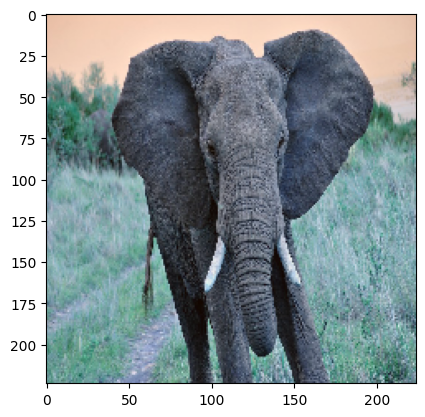

In [5]:
# test image #1
img_path = '/work/elephant.jpg'
img_tensor = load_image_for_vgg_input(img_path)

# plot
plt.imshow(prepare_image_for_display(img_tensor))
plt.show()

In [6]:
# make predictions
preds = base_model.predict(img_tensor)
display_predictions(preds, title="Elephant Image")

1/1 [==============================] - 1s 614ms/step
=== Predictions for Elephant Image ===
35363/35363 [==============================] - 0s 0us/step
tusker (n01871265): 0.5251043
African_elephant (n02504458): 0.46718886
Indian_elephant (n02504013): 0.0076068


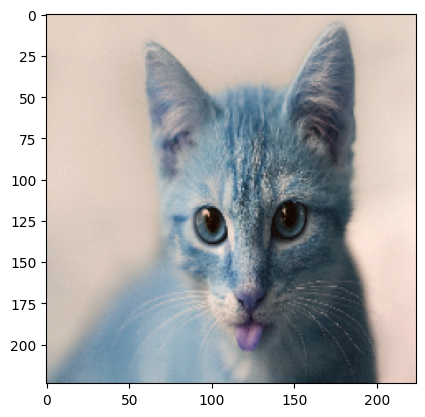

1/1 [==============================] - 0s 393ms/step
=== Predictions for Cat Image ===
Egyptian_cat (n02124075): 0.28061932
tabby (n02123045): 0.14862262
tiger_cat (n02123159): 0.099181294


In [7]:
# test image #2
img_path = '/work/cat.jpg'
img_tensor = load_image_for_vgg_input(img_path)

# plot
plt.imshow(prepare_image_for_display(img_tensor))
plt.show()

# make predictions
preds = base_model.predict(img_tensor)
display_predictions(preds, title="Cat Image")

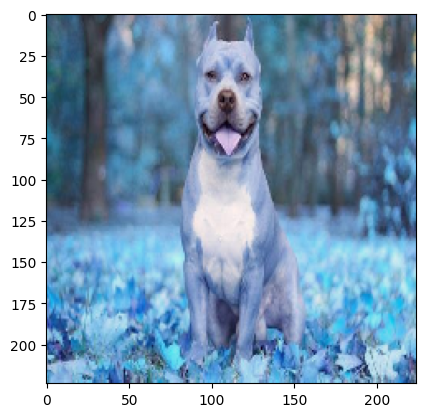

1/1 [==============================] - 0s 479ms/step
=== Predictions for Dog Image ===
American_Staffordshire_terrier (n02093428): 0.6015401
boxer (n02108089): 0.1519053
bull_mastiff (n02108422): 0.096747674


In [8]:
# test image #3
img_path = '/work/dog.jpg'
img_tensor = load_image_for_vgg_input(img_path)

# plot
plt.imshow(prepare_image_for_display(img_tensor))
plt.show()

# make predictions
preds = base_model.predict(img_tensor)
display_predictions(preds, title="Dog Image")

These tests appear to show that our network is working properly. The first image of an elephant received significant votes for tusker and African elephant, which is fitting for the test image. The next test image of a cat was more spread across classes, but the top three are all cats, so we would consider this a successful test. Finally, the last test image of a dog output votes for American Staffordshire terrier and some for boxer. These dog breeds look very similar to the dog in our test image, so we are comfortable saying that VGG19 is functionally validated.

# Multi-channel Filter Analysis

## Filter Choice

We decided to look through various filters in VGG19 using the [OpenAI microscope](https://microscope.openai.com/models/). After some probing, we found filter 510 inside of the block4_conv1 layer.

This filter sits in a layer that is relatively mid-level, with multiple convolutional layers before and after it. Taking our filter from a mid-level portion of the network will give us filters that are not too developed as to require many input filters in the circuit description (more than the six we are visualizing), while also being developed enough to have complex inputs with artifacts that will suggest circuit connections.

The filter itself is interesting to us due to its set of unique defining features. We believe that this filter's characteristics not only give it a visible, logically derived functionality, but will also lead to a well-defined circuit description that should describe the functionality in a coherent way. The first artifact that we noticed was the shift between high and low spatial frequency bands moving across the image from top to bottom. Next, the fact that these frequency shifts come in a horizonal orientation may also lead to a clearer circuit description and certainly helps to suggest a picture for its functionality. Furthermore, there seems to be some notion of eye or blob detection that this filter is able to realize. 



In [16]:
# filter parameters
layer_name = 'block4_conv1'
prev_layer_name = 'block3_conv4'

idx_filter = 510

In [17]:
# create model that outputs the activation of our chosen filter
layer_output = base_model.get_layer(layer_name).output
activation_model = Model(inputs=base_model.input, outputs=layer_output)

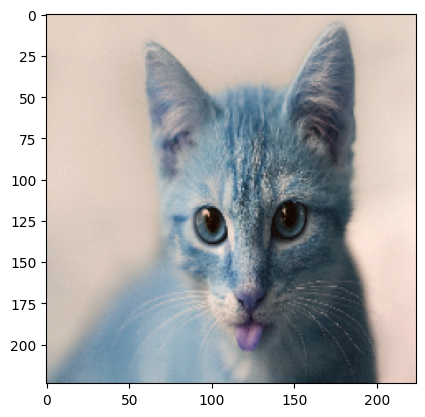

1/1 [==============================] - 0s 354ms/step


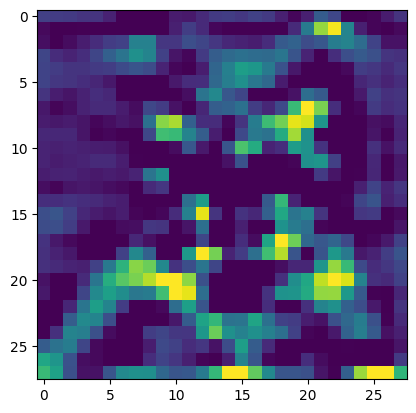

In [18]:
# load test image
img_path = '/work/cat.jpg'
img_tensor = load_image_for_vgg_input(img_path)

# visualize test image
plt.imshow(prepare_image_for_display(img_tensor))
plt.show()

# get filter activation
activation = activation_model.predict(img_tensor)
one_channel = activation[0, :, :, idx_filter]

# visualize activation
plt.imshow(prepare_image_for_display(one_channel,norm_type='std'))
plt.show()

From this activation, we can see that the filter highlights the transition from the clear (high frequency) portion of the cat's face to the blurred (low spatial frequency) portion of the cat's body. This suggests that the filter is a high-to-low frequency detector. In particular, it detects such frequency shifts when oriented horizontally. In the transition from the cat's face to the beige background (also low spatial frequency), at a vertical orientation, the activation does not seem excited at all. In fact, this vertical frequency shift seems to be cause inhibitions from the filter (dark blue color in the activation). Furthermore, there seems to be some notion of eye or blob detection that this filter is able to realize. 

## Input Generation for Maximal Filter Excitation

Now we will take a look at the input image that maximally excites our filter. This may give us a better picture for the functionality of our filter by analyzing what image it is most excited to receive.

In [15]:
def generate_pattern(layer_name, filter_index, epochs=40, size=224):
    '''
    Generate input image that maximally excites chosen filter in specific layer
    based on gradient techniques.
    '''
    # create model that outputs the activation of the chosen filter
    layer_output = base_model.get_layer(layer_name).output
    new_model = Model(inputs=base_model.input, outputs=layer_output)
    
    # initialize input
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128. # gray image with some uniform noise
    
    # keep track of input throughout gradient updates
    I_start = tf.Variable(input_img_data, name='image_var', dtype = 'float64')
    I = preprocess_input(I_start) # only process once

    # run gradient ascent for 'epochs' steps
    eta = 1.
    for i in range(epochs):
        # forward propagation, don't calculate gradients yet
        with tf.GradientTape(watch_accessed_variables=False) as tape:
            tape.watch(I)
            # get variable to maximize 
            model_vals = new_model(I) 
            loss = tf.reduce_mean(model_vals[:, :, :, filter_index])

        # compute gradient
        grad_fn = tape.gradient(loss, I)
        grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5) # normalize the gradient, mean L2 norm
        
        # apply gradient
        I += grad_fn * eta
        
    # return the numpy matrix so we can visualize 
    img = I.numpy()
    return prepare_image_for_display(img, norm_type='std')

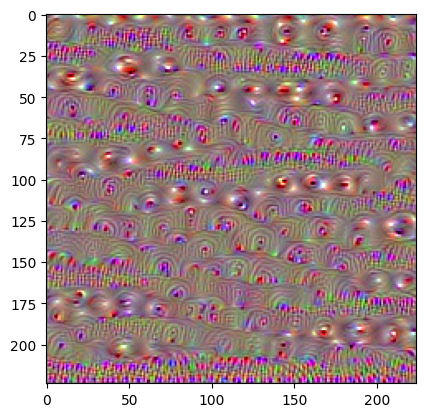

In [16]:
# generate and visualize input image of maximal excitation
# for our chosen filter
plt.imshow(generate_pattern(layer_name,idx_filter))
plt.show()

This is very similar to the image we saw under the OpenAI microscope and it suggests the same functionality we have been discussing throughout this section. Our filter is maximally excited by an image that transitions between low and high spatial frequencies at a horizontal orientation.

This is very similar to the image we saw under the OpenAI microscope and it suggests the same functionality we have been discussing throughout this section.

**Hypothesis: Our filter is maximally excited by an image that transitions between low and high spatial frequencies at a horizontal orientation.**

## Excitation Analysis for ImageNet Classes

The file imagenet_utils.py on keras' GitHub (https://github.com/keras-team/keras/blob/v2.11.0/keras/applications/imagenet_utils.py#L133-L174) contains two pieces of information that we will use when checking which classes of images most excite our chosen filter.
1. The json file of class index (https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json)
2. The number of classes in ImageNet is 1000 (when using weights="ImageNet" in our VGG19 model)

**We will pass an image from each of the 1000 ImageNet classes through our network and record the activation of each image. This allows us to investigate which classes our chosen filter has the most response to.**

First, we use the json file of the class index to obtain a list of ImageNet classes for which we need to provide a sample image. This acts as a ground truth list of classes in ImageNet.

Second, we use this GitHub Repository (https://github.com/EliSchwartz/imagenet-sample-images.git) which provides 1 sample image per class in ImageNet. These images will be passed through VGG19.

We verify that the json file of the classes (from the official Keras ImageNet Utilities file) matches the classes of the sample images in the Github Repository "ImageNet Sample Images". 

Then we throw those 1000 images (1 image per class) into VGG19 and record the activation. The activation (and corresponding image and class) is sorted and we find that the highest activations come respectively from the following classes:
1. Toyshop
2. Picket Fence
3. Carousel
4. Cello
5. Thatch

In [17]:
import pandas as pd 
import os 

In [18]:
#json file of all imagenet classes https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json
#Let's see what 1000 classes imagenet contains

df_imagenet_classes = pd.read_json("/work/imagenet_class_index.json")
df_imagenet_classes = df_imagenet_classes.T
df_imagenet_classes.columns = ['filename','class']

df_imagenet_classes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  1000 non-null   object
 1   class     1000 non-null   object
dtypes: object(2)
memory usage: 55.7+ KB


In [19]:
filepaths=[]
source_dir = '/work/imagenet-sample-images'

filelist = os.listdir(source_dir)
for f in filelist:
    fpath = os.path.join(source_dir,f)
    filepaths.append(fpath)

Fseries = pd.Series(filepaths, name='filepaths')
df = pd.concat([Fseries], axis=1)

df['file'] = df.loc[:, 'filepaths']
df.file = [x.split('/')[-1] for x in df.file]
df.file = [x.split('.')[0] for x in df.file]
df.file = [x.split('_', 1)[-1] for x in df.file]
df.head()

,filepaths,file
0,/work/imagenet-sample-images/n04070727_refrige...,refrigerator
1,/work/imagenet-sample-images/n02107312_miniatu...,miniature_pinscher
2,/work/imagenet-sample-images/n02102177_Welsh_s...,Welsh_springer_spaniel
3,/work/imagenet-sample-images/n04487081_trolley...,trolleybus
4,/work/imagenet-sample-images/n04346328_stupa.JPEG,stupa


In [20]:
img_net_class_list = []
for img_net_class in df_imagenet_classes['class']:
    img_net_class_list.append(img_net_class)

#Github 1000 images from ImageNet
img_net_sample_pics = []
for img_sample in df['file']:
    img_net_sample_pics.append(img_sample)

# not_in_list = []
# for item in img_net_sample_pics:
#     if item in img_net_class_list:
#         pass # print(item)
    
#     else:
#         print("This item not in both lists: ", item)
#         not_in_list.append(item)


Next we will take sum of absolute value of activations for each of the 1000 class images in ImageNet. Find which has a maximum value (which excites our chosen filter the most)

In [21]:
# test
img_tensor = load_image_for_vgg_input('/work/elephant.jpg')
activation = activation_model.predict(img_tensor)

np.sum(np.abs(activation))

1/1 [==============================] - 0s 471ms/step


207763220.0

In [22]:
def get_activation(img):
    img_tensor = load_image_for_vgg_input(img)
    activation = activation_model.predict(img_tensor)
    # return activation
    return np.sum(np.abs(activation))

In [23]:
#for img in df.filepaths:
#if not not_in_list:
# Put an image from each class of ImageNet through our network. Track activation of each image for our filter
df['activation'] = df['filepaths'].apply(get_activation)

1/1 [==============================] - 0s 447ms/step


In [25]:
df_sorted = df.sort_values(by='activation', ascending=False)
df_sorted.head(10)

,filepaths,file,activation
730,/work/imagenet-sample-images/n04462240_toyshop...,toyshop,385280224.0
941,/work/imagenet-sample-images/n03930313_picket_...,picket_fence,367757664.0
208,/work/imagenet-sample-images/n02966193_carouse...,carousel,362869696.0
355,/work/imagenet-sample-images/n03495258_harp.JPEG,harp,351261152.0
47,/work/imagenet-sample-images/n04417672_thatch....,thatch,341659200.0
326,/work/imagenet-sample-images/n03404251_fur_coa...,fur_coat,341150144.0
661,/work/imagenet-sample-images/n04005630_prison....,prison,339332832.0
946,/work/imagenet-sample-images/n03089624_confect...,confectionery,339227488.0
467,/work/imagenet-sample-images/n02777292_balance...,balance_beam,333466272.0
813,/work/imagenet-sample-images/n02017213_Europea...,European_gallinule,332543008.0


Visualize images with top 5 activations

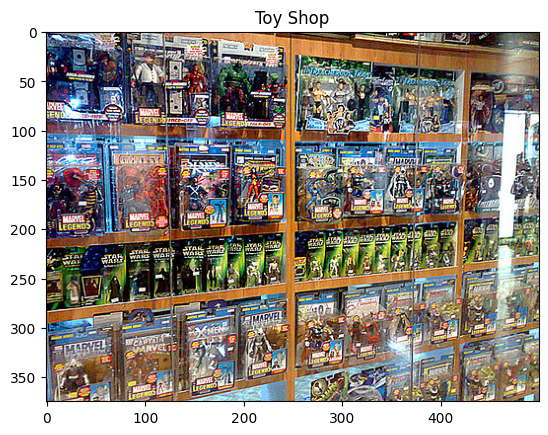

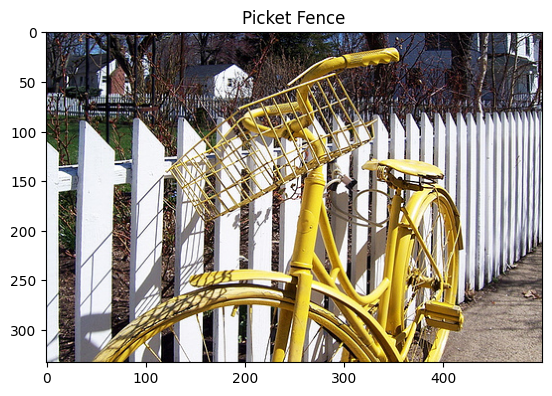

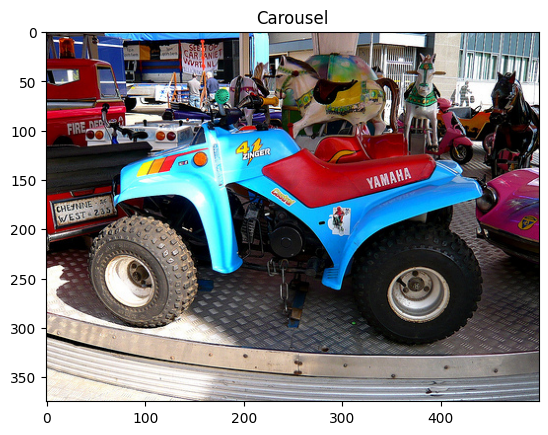

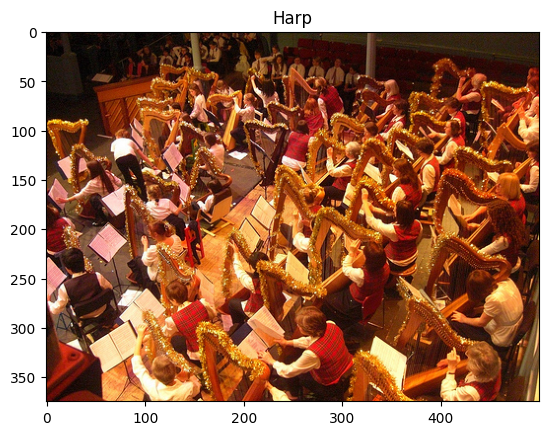

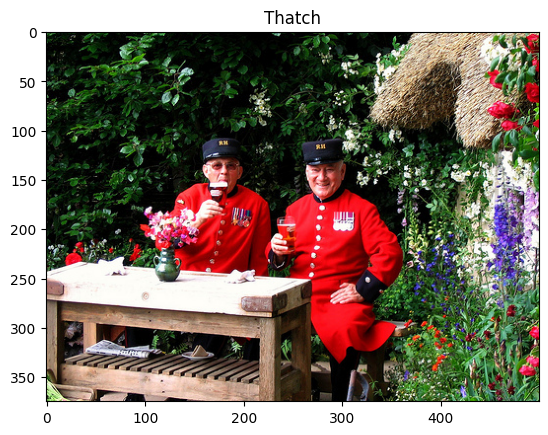

In [5]:
import matplotlib.pyplot as plt
plt.figure()
img = plt.imread("/work/imagenet-sample-images/n04462240_toyshop.JPEG")
plt.title("Toy Shop")
plt.imshow(img)
plt.figure()
img = plt.imread("/work/imagenet-sample-images/n03930313_picket_fence.JPEG")
plt.title("Picket Fence")
plt.imshow(img)
plt.figure()
img = plt.imread("/work/imagenet-sample-images/n02966193_carousel.JPEG")
plt.title("Carousel")
plt.imshow(img)
plt.figure()
img = plt.imread("/work/imagenet-sample-images/n03495258_harp.JPEG")
plt.title("Harp")
plt.imshow(img)
plt.figure()
img = plt.imread("/work/imagenet-sample-images/n04417672_thatch.JPEG")
plt.title("Thatch")
plt.imshow(img)

**Hypothesis for what filter is extracting and function of filter**

This filter is extracting the high-to-low frequency information of the image. It detects frequency shifts across the horizontal direction of the image as well as some blob detection. Shown above is the image with the highest activation, the toy store. This picture has periodic high-to-low frequency bands along the row of each shelf. For example, the image rows ~220 through 290 contain many Star Wars action figures packaged in the same box. This is periodic and is similar for all the shelves across the image.  The image with the second highest activation (picket fence) shows a white picket fence moving across the horizontal direction of the image. There are periodic high-to-low frequency shifts, however they occur in both the horizontal and vertical direction. This supports our hypothesis that the filter detects frequency shifts, although it looks like there could be some influence coming from the vertical high-to-low frequency bands. Also noted are artifacts of blob detection our filter is able to realize. This is in low freuqncy areas, which is typically in the background of these images. 




# Strength of Individual Channels/Input filters

In this section we are extracting the filter coefficients for each input activation so that we can determine their strength and ultimately visualize the input filters with the strongest influence over our chosen filter.

In [20]:
# get weights used to get activation for current filter
layer_weights = base_model.get_layer(layer_name).get_weights()

# layer_weights[0] is filter weights for entire layer
# layer_weights[1] is filter biases for entire layer
mc_filter_weights = np.array(layer_weights[0][:,:,:,idx_filter])

print(mc_filter_weights.shape)

(3, 3, 256)


We would expect to have 256 filters (of size 3x3) because there are 256 activations from the previous layer ('block3_conv4') combined to create the activation for this filter/layer.

Now we can determine the top 6 strongest influences on our choice of filter. Strength, in our case, will be the L2 norm of each filter's weights.

In [21]:
def L2_norm(filter_weights):
    # sqrt( sum of squares )
    return np.sqrt(np.sum( np.square(filter_weights) ))

In [22]:
# determine L2 norm/strength of each input filter to our chosen filter
filter_strengths = np.apply_along_axis(
    L2_norm,0,
    mc_filter_weights.reshape( (mc_filter_weights.shape[0]*mc_filter_weights.shape[1],mc_filter_weights.shape[2]) )
)
strength_ind = np.flip(np.argsort(filter_strengths)) # descending strength

## Visualize Top 6 Single Channel Filter Weights

/tmp/ipykernel_79/482428317.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


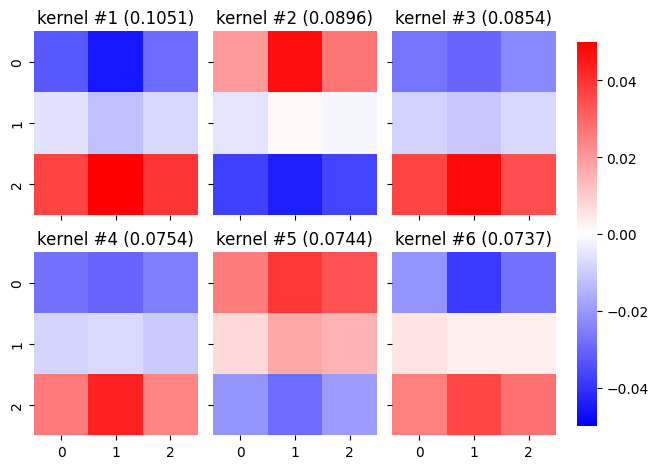

In [24]:
import seaborn as sns

fig, axn = plt.subplots(2, 3, sharex=True, sharey=True)
cbar_ax = fig.add_axes([.91, 0.1, .03, 0.8])

for i,ax in enumerate(axn.flat):
    # get weights for current input filter
    weights = mc_filter_weights[:,:,strength_ind[i]]

    # visualize as heatmap
    ax.set_title(f'kernel #{i+1} ({filter_strengths[strength_ind[i]]:.4f})')
    sns.heatmap(
        weights, ax=ax,
        cbar=(i==0), cbar_ax=None if i else cbar_ax,
        cmap='bwr',vmin=-0.05, vmax=0.05,
    )
fig.tight_layout(rect=[0, 0, .9, 1])

We immediately notice that the structure of these kernels are shared with pairwise spatial symmetries of each filter type: (1 & 3), (2 & 6), and (4 & 5). Kernels 1 and 3 exhibit very similar structure, the top row is mostly inhibitory, the middle row is slightly inhibitory and the bottom row is mostly excitory. The middle column of both these kernels are emphasized in their respective directions. Kernels 2 & 6 exhibit symmetrical structure as Kernel 6 is the horizontal mirror of Kernel 2. The top row of Kernel 2 exhibits weak exhitation with exception of the middle element as very excitory, the middle row is largely 0 with exception of weak inhibitory first element and the bottom row is strongly inhibitory with exception of the middle element being the most inhibitory. Kernel 6 is the horizontal mirror of Kernel 2. The inherent design of the kernels are reminiscent of traditional computer vision kernels. For example, kernel 2 looks similar to a modified laplacian of a gaussian commonly used to do blob detection. Kernels 4 & 5 exhibit symmetrical and complementary structure. The top row of Kernel 4 is strongly inhibitory, the middle row is weakly inhibitory and the bottom row is strongly exhitory. The middle column of both these kernels are emphasized in their respective directions. Interestingly, Kernel 5 represents the horizontal mirror complement (inhibitory to exhitory) of Kernel 4. Kernels 4 and 5 look reminiscent of line detection kernels with one side of the matrix being heavily negative and the other heavily positive. 

# Circuit Construction/Description

## Visualize Top 6 Single Channel Filters (by Max Input Excitation)

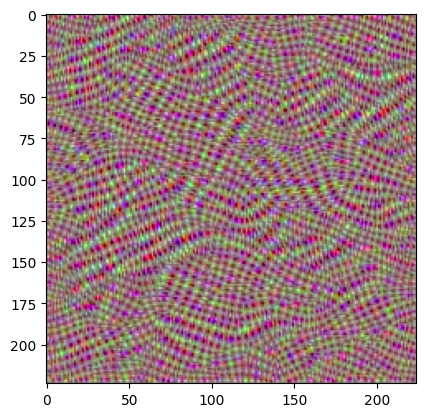

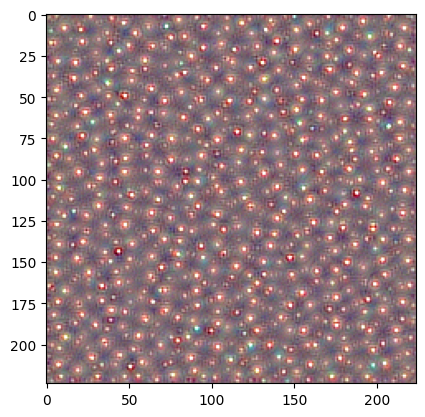

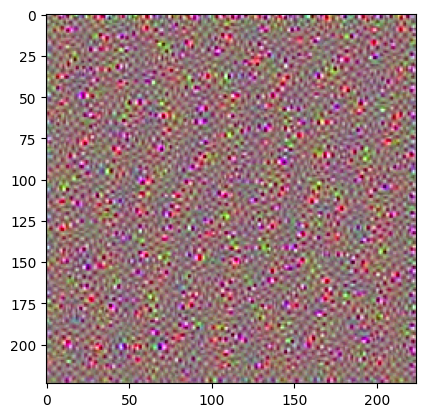

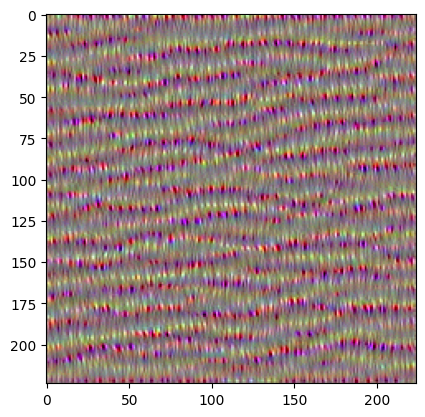

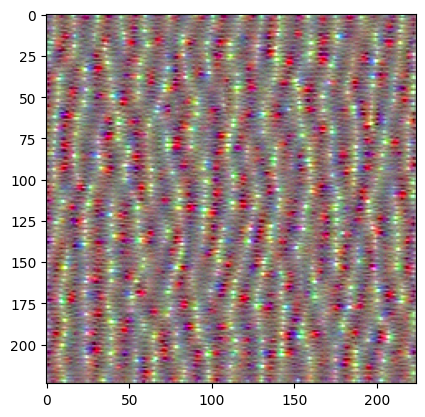

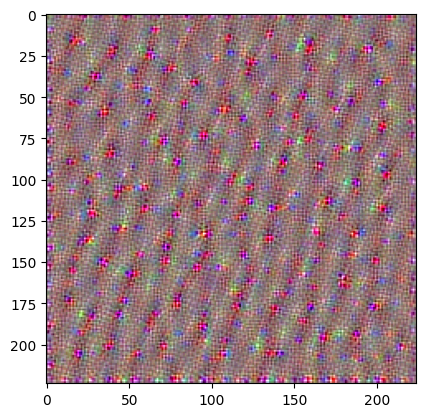

In [30]:
for i in range(6):
    # same gradient with respect to input as above, but with input filters,
    # not our chosen filter
    plt.imshow(generate_pattern(prev_layer_name,strength_ind[i]))
    print()
    plt.show()

## Circuit Visualization

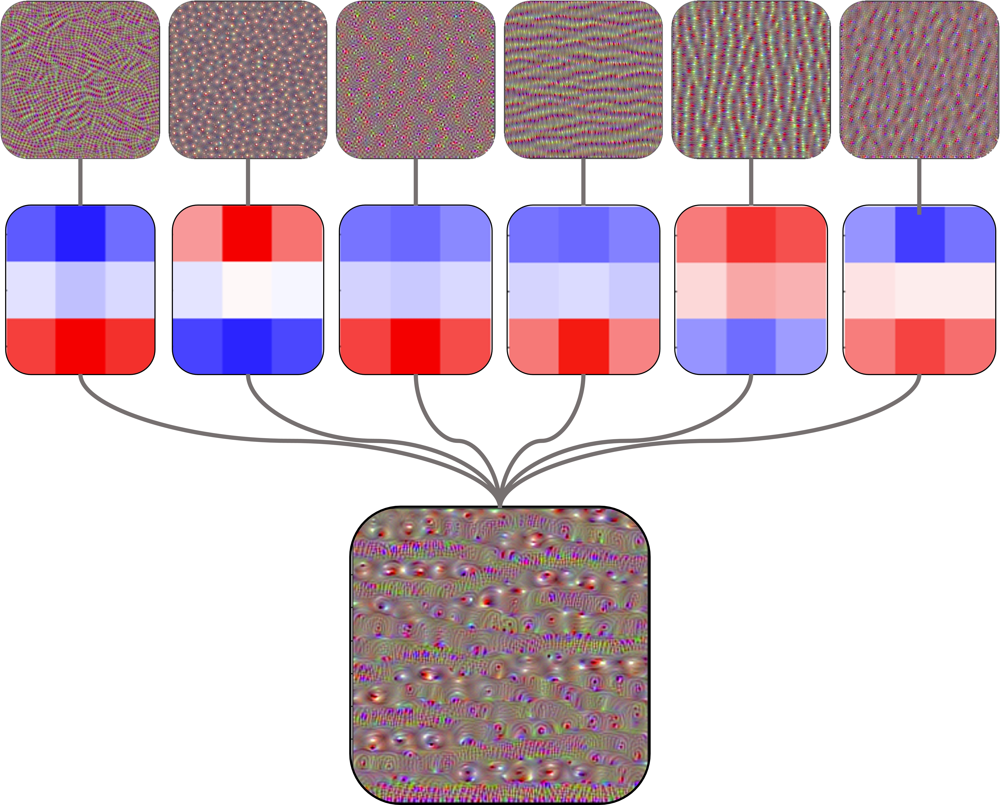

In [31]:
from IPython import display
display.Image("./NNCircuit.jpg")

## Circuit Properties and Conclusion

The image that maximally excites Filter #1 seems to be pose-invariant high frequency circular checker pattern. Filter #1 has the strongest L2 norm and is likely responsible for the apparent random deviations from horizontal of the output image patterns. The image that excites Filter #2 seems to consist of many powerful small scale blobs. The monosemantic blobs are placed seemingly random which leads us to believe that it is also pose-invariant. This filter is likely responsible for the white blobs that appear in the image as well as some of the fringing patterns visible around the blobs. The image that excites Filter #3 seems to consist primarily of high frequency small scale dots arranged in a random manner. It is likely that this filter contributes to the high frequency sensistivity of the resulting output. The image that excites Filter #4 consists of periodic high frequency lines in the horizontal direction and periodic low frequency lines in the vertical direction. These patterns are highly periodic and seem to be pose sensistive. The image that excites Filter #5 is almost like a 90 degree rotation of the image that excited Filter #4. It consists of periodic high frequency lines in the vertical direction and periodic low frequency lines in the horizontal direction. These patterns are highly periodic and seem to be pose sensistive. It is likely that these two filters interact with eachother heavily and are responsible for the horizontal bands of high and low frequency structure present in the output image. It is possible that the strength of low frequency vertical lines in Filter #4 slightly overpowers Filter #5 in certain areas resulting in the apparent horizontal low frequency bands of the output image. The image that excites Filter #6 seems to consist of many low energy very small scale blobs. The monosemantic blobs are placed seemingly random which leads us to believe that it is also pose-invariant. This filter is likely responsible for the dark blobs that appear in the output image.

We can see how these input filter characteristics, along with the horizonal orientation of the kernel weights, and blob detecting kernels, form the polysemantic filter 510 with horizontal band-like areas of high and low frequency structure with blob detection. Therefore, our visualizations and circuit description support our hypothesis that our filter is a horizonal spatial frequency shift detector with blob detection.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=eddfe0b0-336d-4be3-aabf-d557393a7513' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>